In [1]:
#pip install libusb-package

In [2]:
#pip install pyusb

In [3]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install matplotlib

In [6]:
import libusb_package
import usb

In [7]:
for dev in libusb_package.find(find_all=True):
    print(dev)

DEVICE ID 8086:8d2d on Bus 001 Address 000 =================
 bLength                :   0x12 (18 bytes)
 bDescriptorType        :    0x1 Device
 bcdUSB                 :  0x200 USB 2.0
 bDeviceClass           :    0x9 Hub
 bDeviceSubClass        :    0x0
 bDeviceProtocol        :    0x0
 bMaxPacketSize0        :   0x40 (64 bytes)
 idVendor               : 0x8086
 idProduct              : 0x8d2d
 bcdDevice              :  0x100 Device 1.0
 iManufacturer          :    0x0 
 iProduct               :    0x0 
 iSerialNumber          :    0x0 
 bNumConfigurations     :    0x1
  CONFIGURATION 1: 0 mA ====================================
   bLength              :    0x9 (9 bytes)
   bDescriptorType      :    0x2 Configuration
   wTotalLength         :   0x19 (25 bytes)
   bNumInterfaces       :    0x1
   bConfigurationValue  :    0x1
   iConfiguration       :    0x0 
   bmAttributes         :   0xc0 Self Powered
   bMaxPower            :    0x0 (0 mA)
    INTERFACE 0: Hub ====================

In [8]:
import hid
import time
import csv

In [9]:
for device_dict in hid.enumerate():
    keys = list(device_dict.keys())
    keys.sort()
    for key in keys:
        print("%s : %s" % (key, device_dict[key]))
    print()

bus_type : 1
interface_number : 0
manufacturer_string : (Dispositivos de sistema estándar)
path : b'\\\\?\\HID#VID_0D62&PID_2106&MI_00#7&15a7f40c&0&0000#{4d1e55b2-f16f-11cf-88cb-001111000030}\\KBD'
product_id : 8454
product_string : USB Multimedia Keyboard
release_number : 1104
serial_number : 
usage : 6
usage_page : 1
vendor_id : 3426

bus_type : 1
interface_number : 1
manufacturer_string : Emotiv
path : b'\\\\?\\HID#VID_1234&PID_ED02&MI_01#7&2627b7a1&0&0000#{4d1e55b2-f16f-11cf-88cb-001111000030}'
product_id : 60674
product_string : EEG Signals
release_number : 6
serial_number : UD20151119000FD7
usage : 2
usage_page : 65535
vendor_id : 4660

bus_type : 1
interface_number : 1
manufacturer_string : (Dispositivos de sistema estándar)
path : b'\\\\?\\HID#VID_0D62&PID_2106&MI_01#7&e2f49b6&0&0000#{4d1e55b2-f16f-11cf-88cb-001111000030}'
product_id : 8454
product_string : USB Multimedia Keyboard
release_number : 1104
serial_number : 
usage : 1
usage_page : 12
vendor_id : 3426

bus_type : 1
in

In [83]:
try:
    print("Opening the device")

    h = hid.device()
    # h.open(0x534C, 0x0001)  # TREZOR VendorID/ProductID
    h.open(4660, 60674)  # TREZOR VendorID/ProductID

    print("Manufacturer: %s" % h.get_manufacturer_string())
    print("Product: %s" % h.get_product_string())
    print("Serial No: %s" % h.get_serial_number_string())

    # enable non-blocking mode
    h.set_nonblocking(1)

    # write some data to the device
  #  print("Write the data")
   # h.write([0, 63, 35, 35] + [0] * 61)

    # wait
    time.sleep(0.05)

    # Guardado de datos en archivo CSV
    iter = 20 #Iteraciones
    i=0
    with open('Raw_EEG_prueba3.csv', mode='w', newline='') as file:
        writer = csv.writer(file)
        
        # Encabezados de columnas
        writer.writerow(["1", "2", "3","4","5","6","7","8","9","10",
                        "11", "12", "13","14","15","16","17","18","19","20",
                        "21", "22", "23","24","25","26","27","28","29","30", "31", "32"])
    # read the answer
        print("Read the data")
        while i<iter:
            d = h.read(16, 100)
            if d:
                writer.writerow(d)
                print(d)
                i=i+1
            else:
                break

    print("Closing the device")
    h.close()


except IOError as ex:
    print(ex)
    print("You probably don't have the hard-coded device.")
    print("Update the h.open() line in this script with the one")
    print("from the enumeration list output above and try again.")

print("Done")

Opening the device
Manufacturer: Emotiv
Product: EEG Signals
Serial No: UD20151119000FD7
Read the data
[151, 131, 253, 51, 188, 35, 178, 155, 151, 184, 31, 121, 248, 56, 99, 104]
[149, 208, 88, 41, 158, 81, 246, 32, 96, 59, 238, 213, 183, 226, 177, 120]
[184, 18, 5, 162, 143, 25, 178, 120, 143, 52, 235, 148, 23, 194, 31, 30]
[0, 170, 178, 246, 237, 18, 25, 88, 171, 80, 31, 188, 9, 89, 33, 243]
[169, 92, 32, 39, 37, 190, 61, 169, 199, 39, 11, 152, 201, 62, 165, 89]
[186, 147, 66, 30, 183, 109, 98, 8, 224, 58, 204, 45, 71, 18, 93, 109]
[205, 230, 57, 87, 204, 246, 192, 217, 160, 81, 102, 224, 49, 202, 221, 15]
[215, 150, 73, 88, 96, 61, 76, 25, 144, 147, 212, 19, 47, 201, 191, 196]
[203, 37, 139, 52, 20, 147, 39, 140, 174, 3, 57, 232, 41, 175, 177, 76]
[48, 27, 93, 177, 153, 173, 42, 129, 78, 75, 144, 11, 89, 173, 211, 238]
[52, 54, 192, 75, 45, 164, 30, 11, 119, 239, 157, 156, 229, 28, 154, 98]
[57, 31, 230, 5, 214, 108, 127, 217, 232, 209, 29, 112, 18, 197, 198, 237]
[70, 186, 21, 159,

In [11]:
hid.enumerate()

[{'path': b'\\\\?\\HID#VID_0D62&PID_2106&MI_00#7&15a7f40c&0&0000#{4d1e55b2-f16f-11cf-88cb-001111000030}\\KBD',
  'vendor_id': 3426,
  'product_id': 8454,
  'serial_number': '',
  'release_number': 1104,
  'manufacturer_string': '(Dispositivos de sistema estándar)',
  'product_string': 'USB Multimedia Keyboard',
  'usage_page': 1,
  'usage': 6,
  'interface_number': 0,
  'bus_type': 1},
 {'path': b'\\\\?\\HID#VID_1234&PID_ED02&MI_01#7&2627b7a1&0&0000#{4d1e55b2-f16f-11cf-88cb-001111000030}',
  'vendor_id': 4660,
  'product_id': 60674,
  'serial_number': 'UD20151119000FD7',
  'release_number': 6,
  'manufacturer_string': 'Emotiv',
  'product_string': 'EEG Signals',
  'usage_page': 65535,
  'usage': 2,
  'interface_number': 1,
  'bus_type': 1},
 {'path': b'\\\\?\\HID#VID_0D62&PID_2106&MI_01#7&e2f49b6&0&0000#{4d1e55b2-f16f-11cf-88cb-001111000030}',
  'vendor_id': 3426,
  'product_id': 8454,
  'serial_number': '',
  'release_number': 1104,
  'manufacturer_string': '(Dispositivos de sistema e

In [33]:
## EXPLORACIÓN ##
import pandas as pd
data = pd.read_csv('Raw_EEG_tierra.csv')
data2 = pd.read_csv('Raw_EEG_lectura.csv')
data3 = pd.read_csv('Raw_EEG_musica.csv')
data4 = pd.read_csv('Raw_EEG_agarre.csv')

print('Data')
print(data.describe())

print('Data 2')
print(data2.describe())

print('Data 3')
print(data3.describe())

print('Data 4')
print(data4.describe())

Data
                 1            2            3            4            5  \
count  1000.000000  1000.000000  1000.000000  1000.000000  1000.000000   
mean    124.697000   124.231000   127.374000   129.695000   127.276000   
std      73.519591    74.997522    74.396673    73.227305    73.878575   
min       0.000000     1.000000     0.000000     0.000000     0.000000   
25%      59.750000    60.000000    64.000000    66.000000    66.000000   
50%     122.000000   121.500000   126.000000   128.000000   127.000000   
75%     187.250000   188.000000   191.000000   191.250000   191.000000   
max     255.000000   255.000000   255.000000   255.000000   255.000000   

                 6            7            8            9          10  ...  \
count  1000.000000  1000.000000  1000.000000  1000.000000  1000.00000  ...   
mean    130.015000   131.414000   127.758000   127.141000   128.31800  ...   
std      74.706317    73.831888    74.680309    75.505617    73.39943  ...   
min       0.0000

_______________________________________
1     1.000000
27    0.124630
23    0.107477
20    0.102382
12    0.099535
10    0.069087
32    0.051171
30    0.038802
5     0.036678
28    0.034947
19    0.033022
16    0.024815
18    0.021302
14    0.020171
15    0.018077
17    0.017286
6     0.014445
31    0.014039
8     0.006590
21   -0.011027
29   -0.012660
22   -0.014085
13   -0.017232
7    -0.026177
4    -0.026568
9    -0.036652
2    -0.047048
24   -0.055199
3    -0.057519
25   -0.058847
11   -0.065128
26   -0.128828
Name: 1, dtype: float64
_______________________________________
Skewness of the '1' column: 0.11079210894606996


C:\Users\cumLabWS\AppData\Local\Temp\ipykernel_24040\522393931.py:24: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



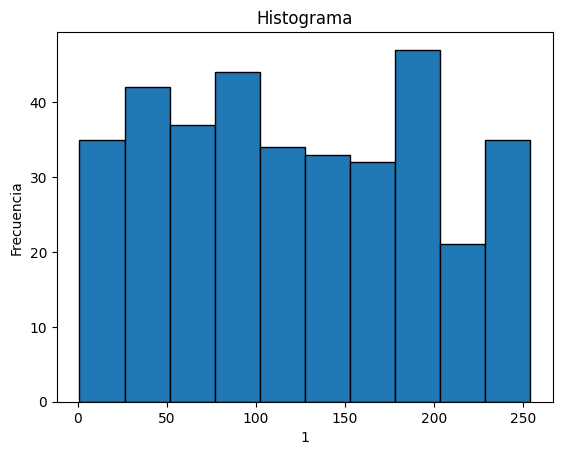

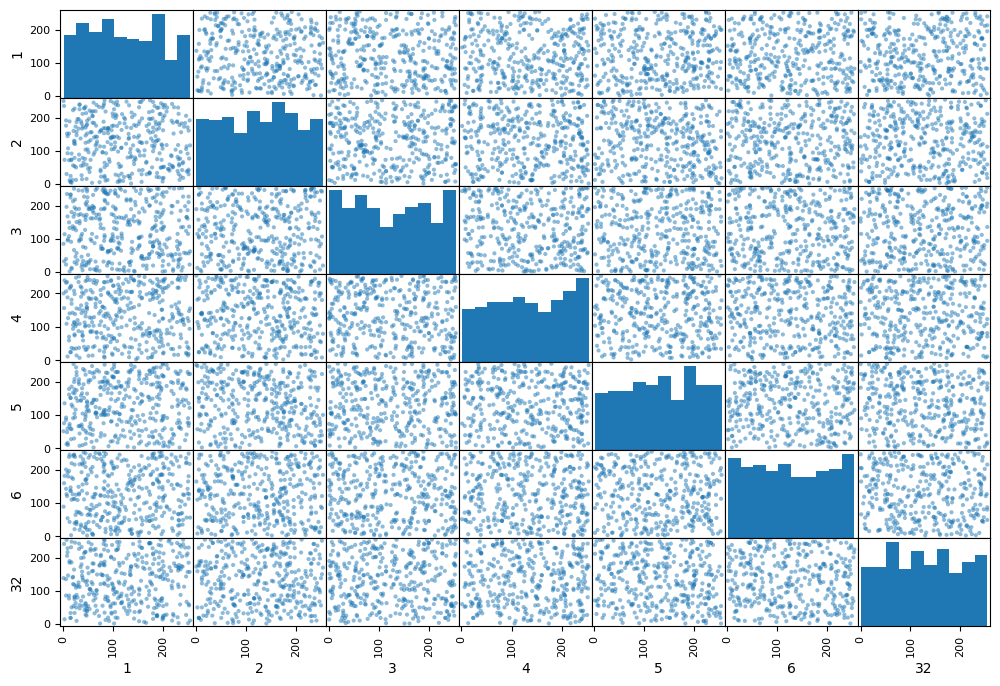

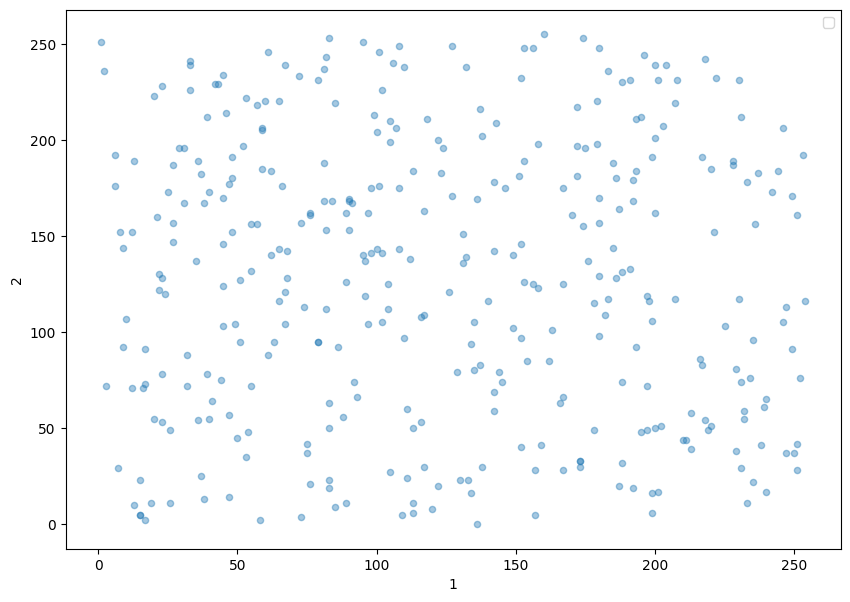

In [13]:
import plotly.express as px
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
# Diagrama de Caja
fig = px.box(data, x='1', title='Diagrama de Caja')
fig.show()

# Gráfica de Barras
fig = plt.hist(data['1'], bins=10, edgecolor='black')
plt.xlabel('1')
plt.ylabel('Frecuencia')
plt.title('Histograma')

# Correlaciones
attributes = ["1", "2","3", "4", "5", "6", "32"]
scatter_matrix(data[attributes], figsize=(12, 8))

corr_matrix = data.corr()
print("_______________________________________")
print(corr_matrix["1"].sort_values(ascending=False))
print("_______________________________________")

data.plot(kind="scatter", x='1', y='2', title='', alpha=0.4, label="", figsize=(10,7))
plt.legend()

skewness = data['1'].skew()
print(f"Skewness of the '1' column: {skewness}")



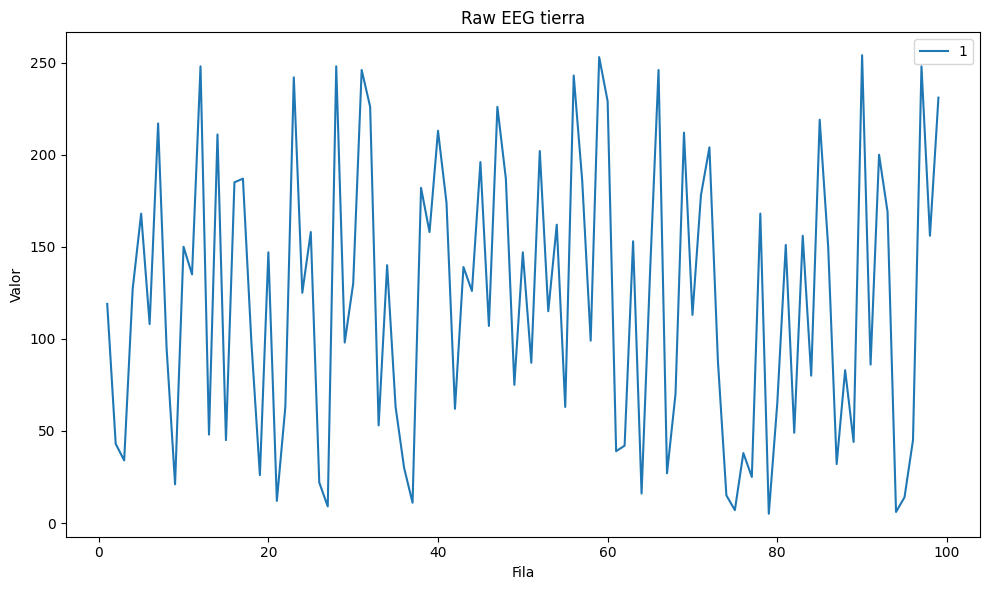

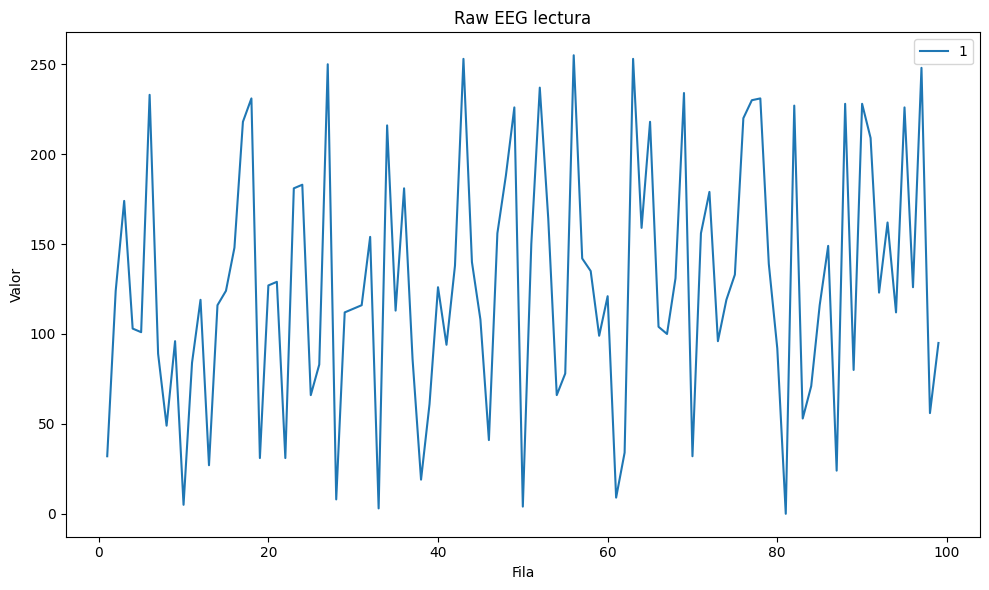

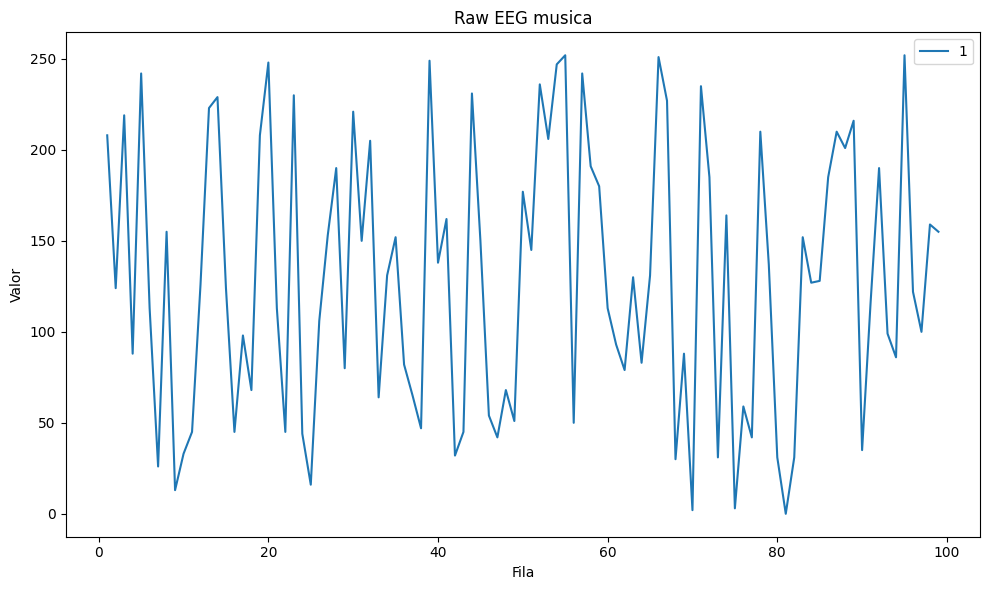

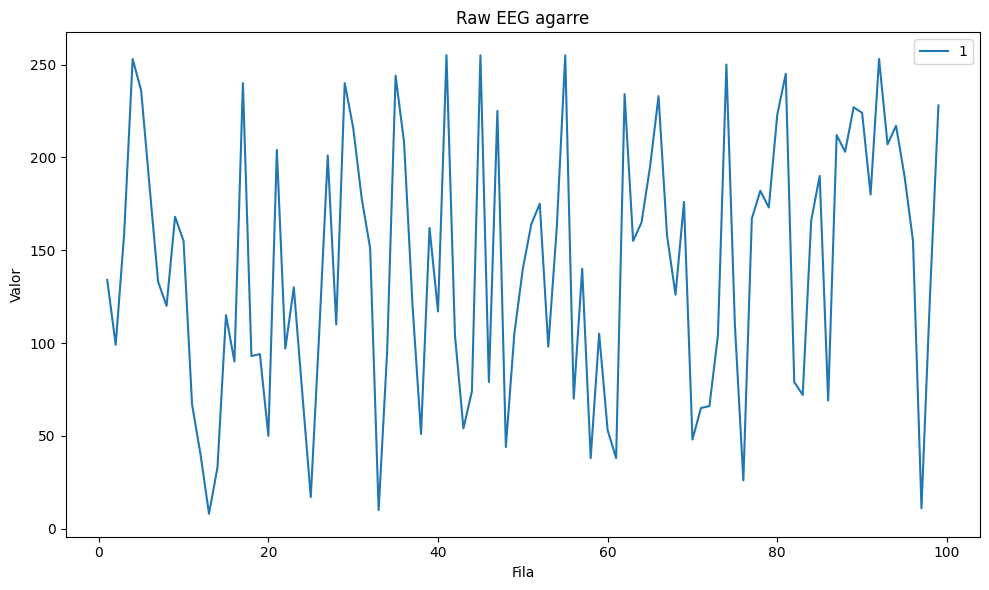

In [40]:
# Graficación de datos
import pandas as pd
import matplotlib.pyplot as plt

num_columnas = 1
data_sub = data.iloc[1:100] #Rango de filas

plt.figure(figsize=(10, 6))
for columna in data.columns[:num_columnas]:
    plt.plot(data_sub.index, data_sub[columna], label=columna)

plt.xlabel('Fila')
plt.ylabel('Valor')
plt.title('Raw EEG tierra')
plt.legend()
plt.tight_layout() 
plt.show()


data_sub = data2.iloc[1:] #Rango de filas

plt.figure(figsize=(10, 6))
for columna in data2.columns[:num_columnas]:
    plt.plot(data_sub.index, data_sub[columna], label=columna)

plt.xlabel('Fila')
plt.ylabel('Valor')
plt.title('Raw EEG lectura')
plt.legend()
plt.tight_layout() 
plt.show()


data_sub = data3.iloc[1:]  #Rango de filas

plt.figure(figsize=(10, 6))
for columna in data2.columns[:num_columnas]:
    plt.plot(data_sub.index, data_sub[columna], label=columna)

plt.xlabel('Fila')
plt.ylabel('Valor')
plt.title('Raw EEG musica')
plt.legend()
plt.tight_layout() 
plt.show()



data_sub = data4.iloc[1:]  #Rango de filas

plt.figure(figsize=(10, 6))
for columna in data2.columns[:num_columnas]:
    plt.plot(data_sub.index, data_sub[columna], label=columna)

plt.xlabel('Fila')
plt.ylabel('Valor')
plt.title('Raw EEG agarre')
plt.legend()
plt.tight_layout() 
plt.show()


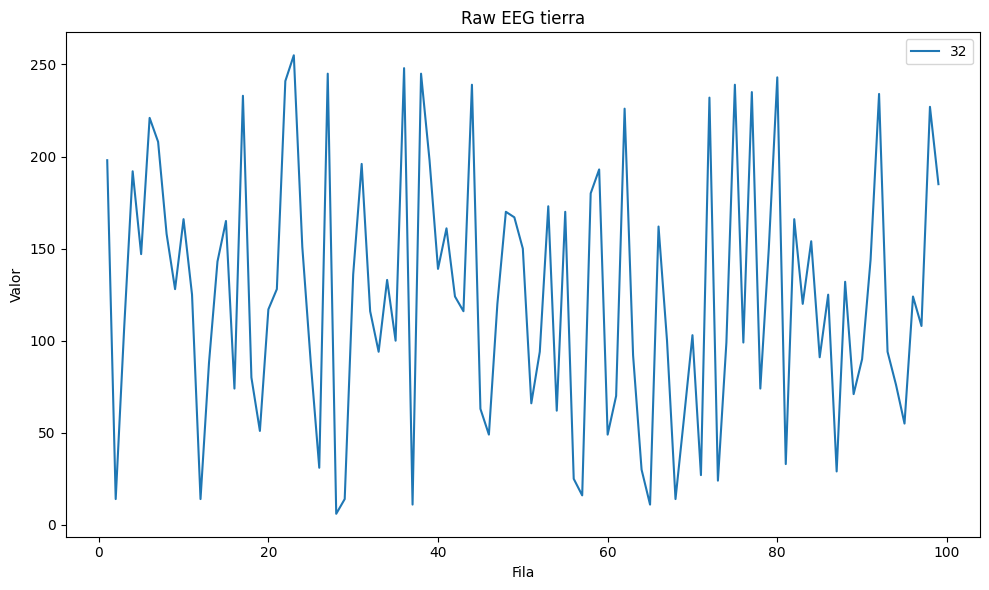

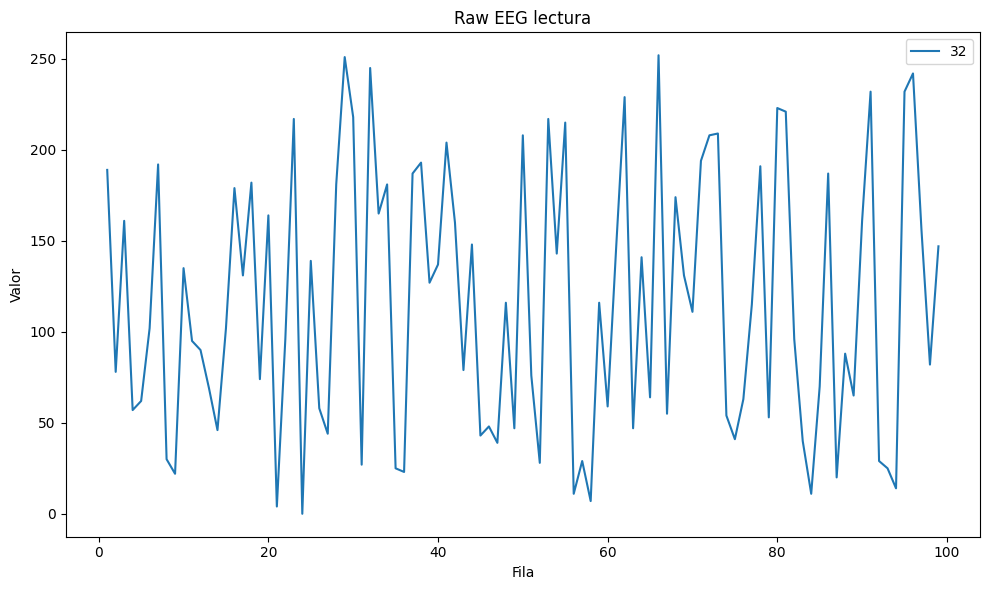

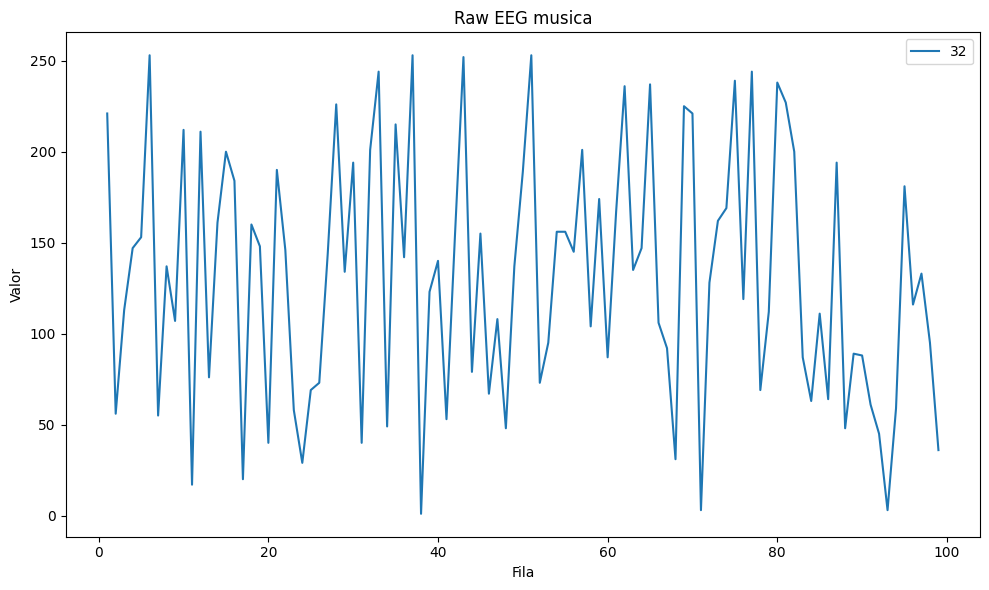

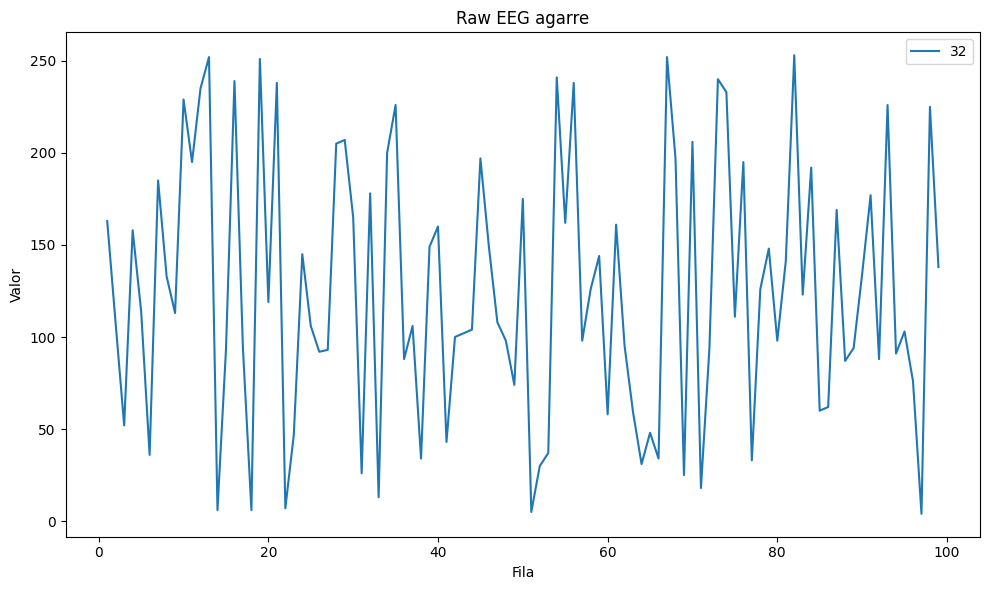

In [70]:
# Graficación de datos
import pandas as pd
import matplotlib.pyplot as plt

num_columnas=1
col_inicial=32
fila_inf=1
fila_sup=100

data_sub = data.iloc[fila_inf:fila_sup] #Rango de filas
columnas_sub = data_sub.iloc[:, (col_inicial-1):32] #Rango de columnas

plt.figure(figsize=(10, 6))
for columna in columnas_sub.columns[:num_columnas]:
    plt.plot(data_sub.index, columnas_sub[columna], label=columna)

plt.xlabel('Fila')
plt.ylabel('Valor')
plt.title('Raw EEG tierra')
plt.legend()
plt.tight_layout() 
plt.show()


data_sub = data2.iloc[fila_inf:fila_sup] #Rango de filas
columnas_sub = data_sub.iloc[:, (col_inicial-1):32] #Rango de columnas

plt.figure(figsize=(10, 6))
for columna in columnas_sub.columns[:num_columnas]:
    plt.plot(data_sub.index, columnas_sub[columna], label=columna)

plt.xlabel('Fila')
plt.ylabel('Valor')
plt.title('Raw EEG lectura')
plt.legend()
plt.tight_layout() 
plt.show()


data_sub = data3.iloc[fila_inf:fila_sup] #Rango de filas
columnas_sub = data_sub.iloc[:, (col_inicial-1):32] #Rango de columnas

plt.figure(figsize=(10, 6))
for columna in columnas_sub.columns[:num_columnas]:
    plt.plot(data_sub.index, columnas_sub[columna], label=columna)
    
plt.xlabel('Fila')
plt.ylabel('Valor')
plt.title('Raw EEG musica')
plt.legend()
plt.tight_layout() 
plt.show()



data_sub = data4.iloc[fila_inf:fila_sup] #Rango de filas
columnas_sub = data_sub.iloc[:, (col_inicial-1):32] #Rango de columnas

plt.figure(figsize=(10, 6))
for columna in columnas_sub.columns[:num_columnas]:
    plt.plot(data_sub.index, columnas_sub[columna], label=columna)

plt.xlabel('Fila')
plt.ylabel('Valor')
plt.title('Raw EEG agarre')
plt.legend()
plt.tight_layout() 
plt.show()
